In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import xgboost as xgb
from xgboost import plot_importance
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

#### 1. Data Prep

Choose 2019 and produce a file, each stores the data of return, volatility and financial indicators for every stock in the ticker list in a specific year

In [3]:
data = pd.read_excel('./data/financial_ratios_5_years.xlsx')
data = data.set_index('Unique_Index')
data.head()

,Unnamed: 0,symbol,Ratio,2018,2019,2020,2021,2022
Unique_Index,,,,,,,,
DHR_currentRatio,0,DHR,currentRatio,1.465207,5.189797,1.864631,1.430958,1.893313
DHR_quickRatio,1,DHR,quickRatio,0.883487,4.684354,1.361794,0.886609,1.300870
DHR_cashRatio,2,DHR,cashRatio,0.162718,4.037286,0.815320,0.317690,0.714626
DHR_daysOfSalesOutstanding,3,DHR,daysOfSalesOutstanding,64.027748,65.035704,66.254936,57.390249,57.038861
DHR_daysOfInventoryOutstanding,4,DHR,daysOfInventoryOutstanding,79.352884,74.971554,85.286981,87.814538,90.652452


#### Feature derivation: Adding return and volatility along with other financial ratios

In [4]:
# Import stock data and calculate return and volatility
stock_data = pd.read_csv('./data/stock_price_1.csv')
stock_data = stock_data.set_index('date')
stock_data.index = pd.to_datetime(stock_data.index)
stock_data = stock_data.sort_index()
stock_data.head()

,CMA,TECH,FIS,CBRE,NWS,WST,PAYX,CME,MSI,COF,...,FITB,TXN,TXT,CRL,ENPH,SYY,PPG,PRU,DXC,KO
date,,,,,,,,,,,,,,,,,,,,,
1980-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.684809,NaN,...,NaN,0.864275,1.645590,NaN,NaN,0.110437,NaN,NaN,0.8300,0.208888
1980-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.628874,NaN,...,NaN,0.868133,1.668767,NaN,NaN,0.110437,NaN,NaN,0.8185,0.214304
1980-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.712778,NaN,...,NaN,0.873277,1.722847,NaN,NaN,0.110437,NaN,NaN,0.8300,0.216625
1980-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.782691,NaN,...,NaN,0.883567,1.753750,NaN,NaN,0.110437,NaN,NaN,0.8414,0.215851
1980-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.034393,NaN,...,NaN,0.982597,1.715121,NaN,NaN,0.110437,NaN,NaN,0.8872,0.217398


In [5]:
#Only want the 2019 data
# Missing value replace by 0
price_2019 = stock_data.loc["2019-01-02 00:00:00":"2019-12-31 00:00:00"].fillna(0)
price_2019.head()

,CMA,TECH,FIS,CBRE,NWS,WST,PAYX,CME,MSI,COF,...,FITB,TXN,TXT,CRL,ENPH,SYY,PPG,PRU,DXC,KO
date,,,,,,,,,,,,,,,,,,,,,
2019-01-02,58.472511,34.805275,95.977623,39.930000,11.049089,95.132759,57.702507,161.778763,108.164413,71.743179,...,20.810059,84.198593,45.805775,111.089996,4.92,55.700104,94.509163,66.996239,52.396492,41.413994
2019-01-03,58.086838,33.377846,93.025330,37.889999,10.906338,93.277649,56.727062,158.222061,104.376114,70.721741,...,20.792862,79.233154,44.642990,104.820000,4.76,55.438141,91.051842,65.861641,52.608036,41.158070
2019-01-04,59.948170,35.438053,96.308830,39.450001,11.382183,96.938499,58.704567,160.994217,108.899445,73.860382,...,21.291613,82.816833,46.590908,109.750000,5.08,55.871742,92.854866,68.916885,55.117756,41.978771
2019-01-07,60.476379,35.778973,96.914421,40.009998,11.610586,97.244392,58.394207,160.183456,109.408340,74.268959,...,21.411997,84.243172,46.143681,112.559998,5.26,55.826576,93.161537,68.884460,55.156223,41.431641
2019-01-08,60.635677,36.132149,97.643021,41.320000,11.724790,100.342789,58.837585,159.233276,112.621803,74.306114,...,21.523790,84.136192,47.256771,117.580002,5.35,56.711842,93.932930,69.289665,56.887062,41.899345


In [6]:
#Calculate returns and price volatility
ticker_list = list(stock_data.columns[1:])

price_data = pd.DataFrame(columns=ticker_list)
price_data.loc['returns_2019'] = round((price_2019.loc["2019-12-31 00:00:00"] / price_2019.loc["2019-01-02 00:00:00"] - 1)*100)
price_data.loc['sd_2019'] = price_2019.std(axis=0)

price_data = price_data.fillna(0)
# make sure the ticker match for financial ratio and stock data
tickers_fr = sorted(set(data['symbol']))
tickers_stock = sorted(stock_data.columns)

for tic in tickers_stock:
    if (tic not in tickers_fr):
        price_data = price_data.drop(columns=tic)
        
price_data

,TECH,FIS,NWS,WST,PAYX,CME,MSI,COF,STZ,CSX,...,FDX,FITB,TXN,CRL,ENPH,SYY,PPG,PRU,DXC,KO
returns_2019,56.00000,39.000000,27.00000,57.000000,35.000000,11.000000,43.00000,36.00000,17.000000,18.000000,...,-6.000000,31.000000,40.000000,38.000000,431.000000,41.000000,34.000000,18.000000,-30.000000,22.000000
sd_2019,3.94304,11.653788,0.83713,17.216244,5.081326,14.182201,17.33011,6.45374,13.746182,1.433817,...,12.222439,1.541739,9.252037,8.607239,7.912324,6.062094,8.235773,4.997133,13.554726,3.304135


In [7]:
# Combine financial ratio, return and volatility into a files

ratio_name = list(data.index[0:54]) # There are 54 financial ratios for each company
tickers = price_data.columns
year = '2019'

# The columns names for yearly financial ratios
col_name = []
for ele in ratio_name:
    col_name.append(ele[4:])



def single_tic_financial_ratio_dict(data, tic, year):
    dct = {}
    for ele in col_name:
        dct[ele] = data.loc[f'{tic}_{ele}'][year]
    return dct


# Yearly financial ratio dataframe
fr_df = pd.DataFrame(columns=col_name) 
for tic in tickers:
    fr_dct = single_tic_financial_ratio_dict(data, tic, year)
    fr_df = fr_df.append(fr_dct, ignore_index=True)
    
#Get financial data of each year into csv
fr_df.index = tickers
fr_df['returns'] = price_data.loc[f'returns_{year}']
fr_df['volatility'] = price_data.loc[f'sd_{year}']
fr_df.to_csv(f"./generated_data/{year}_financial_data_all_company.csv")

### 2. Feature Engineering

#### 2.1 Data Cleaning

Fill in missing value with 0

In [8]:
def fill_missing_value(pth):
    ratio_data = pd.read_csv(pth)
    ratio_data = ratio_data.fillna(0)
    return ratio_data

ratio_data_2019 = fill_missing_value('./generated_data/2019_financial_data_all_company.csv')
ratio_data_2019.head()

,Unnamed: 0,currentRatio,quickRatio,cashRatio,daysOfSalesOutstanding,daysOfInventoryOutstanding,operatingCycle,daysOfPayablesOutstanding,cashConversionCycle,grossProfitMargin,...,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceEarningsToGrowthRatio,priceSalesRatio,dividendYield,enterpriseValueMultiple,priceFairValue,returns,volatility
0,TECH,4.045762,2.975918,0.989224,70.272645,138.175374,208.448018,24.599921,183.848097,0.663147,...,50.612338,43.530975,43.530975,-3.229452,11.072809,0.006117,39.219816,6.782881,56.0,3.943040
1,FIS,0.837218,0.529956,0.110961,153.658183,0.000000,153.658183,76.534039,77.124143,0.360302,...,39.124558,25.682593,25.682593,-2.805602,5.990037,0.010599,25.089461,1.251923,39.0,11.653788
2,NWS,1.212575,0.954192,0.491916,55.942029,0.000000,0.000000,0.000000,0.000000,0.000000,...,22.989185,8.819127,8.819127,0.478336,0.812403,0.019672,8.002152,0.895030,27.0,0.837130
3,WST,3.099239,2.220141,1.285422,63.342845,69.705477,133.048322,46.371739,86.676583,0.329203,...,46.197757,30.295261,30.295261,2.741959,6.046209,0.004054,26.544401,7.071205,57.0,17.216244
4,PAYX,1.171868,0.323385,0.139030,82.646256,0.000000,82.646256,23.521396,59.124860,0.687793,...,26.850020,24.235759,24.235759,2.766303,8.168527,0.026830,19.767448,11.763989,35.0,5.081326


#### 2.2 Feature Selection

##### (1) Standardlization

In [9]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler = StandardScaler() 
df_ratio_scaled = ratio_data_2019.copy()
df_ratio_scaled=df_ratio_scaled.rename(columns = {'Unnamed: 0':'symbol'})
for col in list(df_ratio_scaled.columns)[1:]:
    # data cleaning
    low,high = df_ratio_scaled[col].quantile([.25,.75])
    df_ratio_scaled[col] = df_ratio_scaled[col].clip(low,high)
    # standardization
    df_ratio_scaled[col] = scaler.fit_transform(df_ratio_scaled[[col]])
df_ratio_scaled.head()

,symbol,currentRatio,quickRatio,cashRatio,daysOfSalesOutstanding,daysOfInventoryOutstanding,operatingCycle,daysOfPayablesOutstanding,cashConversionCycle,grossProfitMargin,...,priceToFreeCashFlowsRatio,priceToOperatingCashFlowsRatio,priceCashFlowRatio,priceEarningsToGrowthRatio,priceSalesRatio,dividendYield,enterpriseValueMultiple,priceFairValue,returns,volatility
0,TECH,1.358706,1.337817,1.336286,1.031715,1.259162,1.252825,-1.061163,1.311963,1.248770,...,1.246792,1.226769,1.226769,-1.235924,1.304624,-1.230036,1.266961,1.358736,1.230592,-0.978728
1,FIS,-1.124983,-1.077359,-0.949664,1.208698,-1.084587,1.252825,1.287620,1.101340,-0.252636,...,1.246792,1.226769,1.226769,-1.235924,1.304624,-0.780306,1.266961,-1.052641,0.631262,1.270370
2,NWS,-0.349899,0.063891,0.826554,0.071581,-1.084587,-1.197441,-1.182064,-1.127965,-1.228453,...,0.344916,-1.196027,-1.196027,0.200220,-1.171354,0.193299,-1.184920,-1.052641,-0.396160,-1.105731
3,WST,1.358706,1.337817,1.336286,0.567427,1.145233,1.108916,0.032867,1.311963,-0.467318,...,1.246792,1.226769,1.226769,1.303396,1.304624,-1.230036,1.266961,1.358736,1.230592,1.329895
4,PAYX,-0.437236,-1.137103,-0.818793,1.208698,-1.084587,-0.248854,-1.115359,0.581063,1.248770,...,0.852887,1.226769,1.226769,1.303396,1.304624,0.961386,1.266961,1.358736,0.288788,-0.646709


#### (2) Check correlation

In [10]:
fig = plt.figure(figsize=(30, 30), dpi = 300)
  
# plotting correlation heatmap
dataplot = sns.heatmap(ratio_data_2019.corr(), cmap="YlGnBu", annot=True, square = True)
  
# displaying heatmap
plt.show()

Manully drop high correlated features (but keep one of the similar ones)

In [11]:
drop_features = ['quickRatio', 'cashRatio', 
                 'pretaxProfitMargin', 'operatingProfitMargin', 
                 'longTermDebtToCapitalization', 'operatingCashFlowPerShare', 'priceToOperatingCashFlowsRatio',
                 'ebitPerRevenue', 'priceFairValue', 'priceSalesRatio', 'priceBookValueRatio', 
                 'payoutRatio', 'cashFlowCoverageRatios', 'companyEquityMultiplier','priceToBookRatio',
                 'operatingCashFlowSalesRatio', 'debtEquityRatio']

ratio_data_2019 = ratio_data_2019.drop(drop_features,axis=1)
df_ratio_scaled = df_ratio_scaled.drop(drop_features,axis=1)

In [12]:
ratio_data_2019.shape

(429, 40)

In [13]:
fig = plt.figure(figsize=(30, 30), dpi = 300)
  
# plotting correlation heatmap
dataplot = sns.heatmap(ratio_data_2019.corr(), cmap="YlGnBu", annot=True, square = True)
  
# displaying heatmap
plt.show()

#### (3) Feature Selection using XGB

In [14]:
# feature selection
FEATURE_NUM = 7

# train a xgboost model
model = XGBRegressor(
    learning_rate=0.01,
    n_estimators=100,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    gamma=0,
    reg_alpha=0,
    reg_lambda=1,
    min_child_weight=1,
    objective='reg:squarederror',
    random_state=42
)
model.fit(df_ratio_scaled.drop(columns=['returns','symbol']), df_ratio_scaled['returns'])

# select feature based on their score
feature_important = model.get_booster().get_score(importance_type='weight')
keys = list(feature_important.keys())
values = list(feature_important.values())
feature_important = pd.DataFrame(data=values, index=keys, columns=["score"]).sort_values(by = "score", ascending=False)
features = feature_important.nlargest(FEATURE_NUM, columns="score").reset_index()['index'].values.tolist()

print(f'The important top {FEATURE_NUM} features are: {features}')

# Get only the columns with 
ratio_important = df_ratio_scaled[features]

The important top 7 features are: ['currentRatio', 'daysOfSalesOutstanding', 'volatility', 'priceEarningsToGrowthRatio', 'netProfitMargin', 'shortTermCoverageRatios', 'grossProfitMargin']


Importance feature visualization

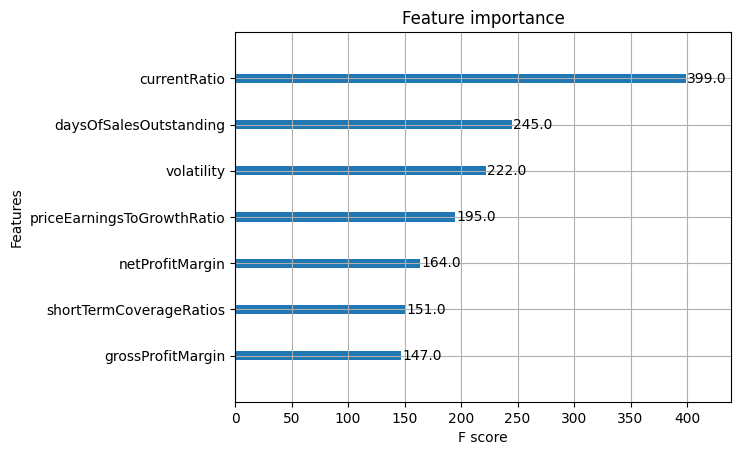

In [15]:
plot_importance(model, max_num_features=7) # top 7 most important features
plt.show()

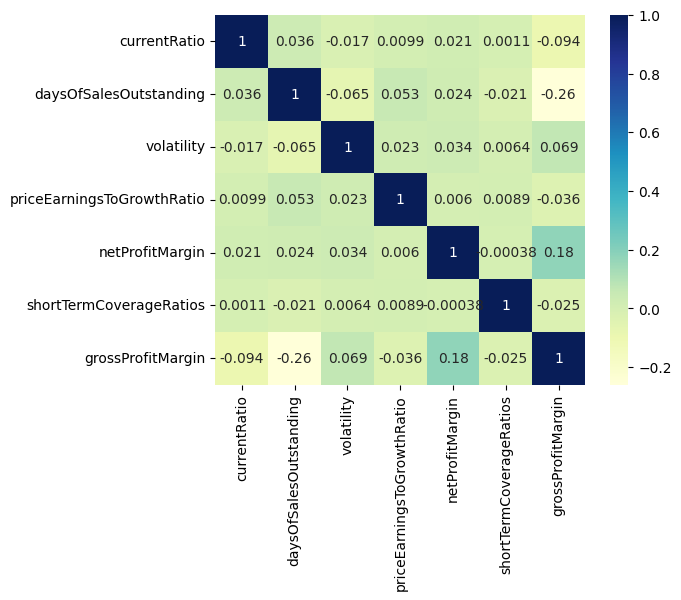

In [16]:
selected_features = ratio_data_2019[list(feature_important.index[0:7])]

# plotting correlation heatmap
dataplot = sns.heatmap(selected_features.corr(), cmap="YlGnBu", annot=True, square = True)
  
# displaying heatmap
plt.show()

In [17]:
# selected_features['returns'] = ratio_data_2019.loc[:,'returns'].copy()
# # selected_features
# sns.pairplot(selected_features, hue="returns")

#### (3) Clustering

Perform Cluster analysis based on the above selected financial indicators.

Use elbow method to select the number of clusters

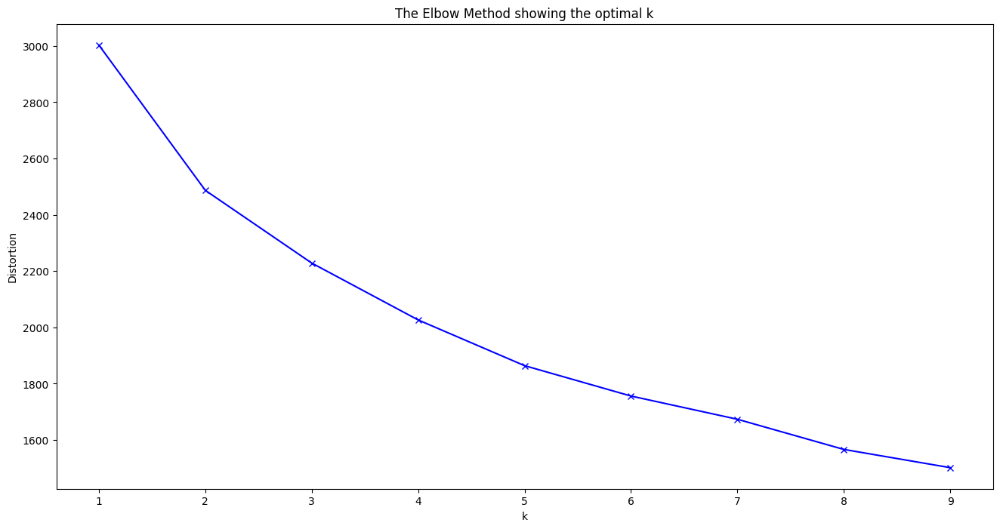

In [18]:
# Running K-Means with a range of k
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, init='k-means++', random_state=101, max_iter = 30000)
    kmeanModel.fit(df_ratio_scaled[features].fillna(0))
    distortions.append(kmeanModel.inertia_)

# Plotting the distortions of K-Means   
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

Perform hierarchical clustering analysis to see which cluster size we should use

We set the y threshold to be 50, and we can see that there are 2 clusters in total to balance the cluster.

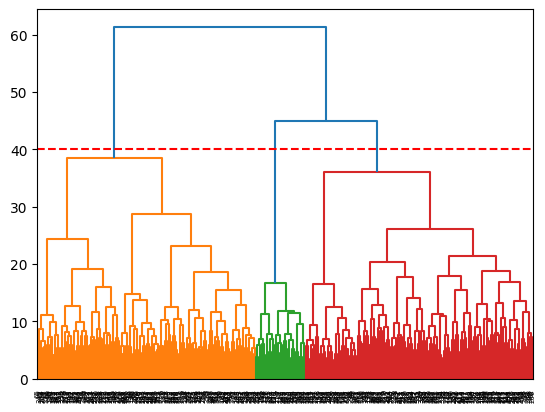

In [19]:
X = df_ratio_scaled.drop(columns='symbol').values

# Calculate linkage matrix using "ward" linkage.
Z_complete = linkage(X, 'ward')

# Plot dendrogram for ward method.
dendrogram(Z_complete)

# Show the plot.
plt.axhline(y=40, color='r', linestyle='--')

We can see from both methods of finding the right number of clusters, it is best to choose a cluster of 2

In [20]:
CLUSTER_NUM = 3

kmeans = KMeans(n_clusters=CLUSTER_NUM, init='k-means++', random_state=101, max_iter = 30000)
model_kmeans = kmeans.fit(df_ratio_scaled[features].fillna(0))
print(pd.DataFrame(model_kmeans.labels_).value_counts())

df_result_kmeans = pd.DataFrame({'ticker':df_ratio_scaled['symbol'], 'cluster':model_kmeans.labels_})
df_result_kmeans.to_csv(f'./generated_data/clustered_{CLUSTER_NUM}.csv', index=False)

0    203
2    121
1    105
dtype: int64


In [21]:
from sklearn.metrics import silhouette_score

# scores = []
# idx = range(2, 100)

# for num in idx:
kmeans = KMeans(n_clusters=num, init='k-means++', random_state=101, max_iter = 30000)
model_kmeans = kmeans.fit(df_ratio_scaled[features].fillna(0))
score = silhouette_score(df_ratio_scaled[features].fillna(0), kmeans.labels_, metric='euclidean')
# scores.append(score)
    
# print(scores)

# plt.plot(idx, scores,'bx-')
# plt.xlabel('Values of K') 
# plt.ylabel('Silhouette score') 
# plt.title('Silhouette analysis For Optimal k')
# plt.show()

NameError: name 'num' is not defined

In [ ]:
df_complete = pd.concat([df_result_kmeans['cluster'],ratio_important], axis=1)
df_complete.head()

,cluster,currentRatio,daysOfSalesOutstanding,volatility,priceEarningsToGrowthRatio,netProfitMargin,shortTermCoverageRatios,grossProfitMargin
0,1,1.358706,1.031715,-0.978728,-1.235924,0.016742,1.484390,1.248770
1,0,-1.124983,1.208698,1.270370,-1.235924,-1.109885,-0.966062,-0.252636
2,0,-0.349899,0.071581,-1.105731,0.200220,-1.109885,-0.562908,-1.228453
3,1,1.358706,0.567427,1.329895,1.303396,-0.039866,1.484390,-0.467318
4,2,-0.437236,1.208698,-0.646709,1.303396,1.374541,-0.966062,1.248770


In [ ]:
ratio_important_cluster = pd.concat([df_complete['cluster'], ratio_important], axis=1)

mean_df = pd.DataFrame()
for ratio in ratio_important:
    mean_df[ratio] = ratio_important_cluster.groupby('cluster', as_index=False)[ratio].mean()[ratio]
    
mean_df_t = mean_df.T
mean_df_t = mean_df_t.reset_index()
mean_df_t

,index,0,1,2
0,currentRatio,-0.392386,0.784939,-0.022845
1,daysOfSalesOutstanding,-0.097091,0.069729,0.102379
2,volatility,-0.394704,0.541294,0.192471
3,priceEarningsToGrowthRatio,-0.089109,0.404986,-0.201937
4,netProfitMargin,-0.584983,0.231737,0.780324
5,shortTermCoverageRatios,-0.227306,1.203655,-0.663145
6,grossProfitMargin,-0.730221,0.388368,0.888067


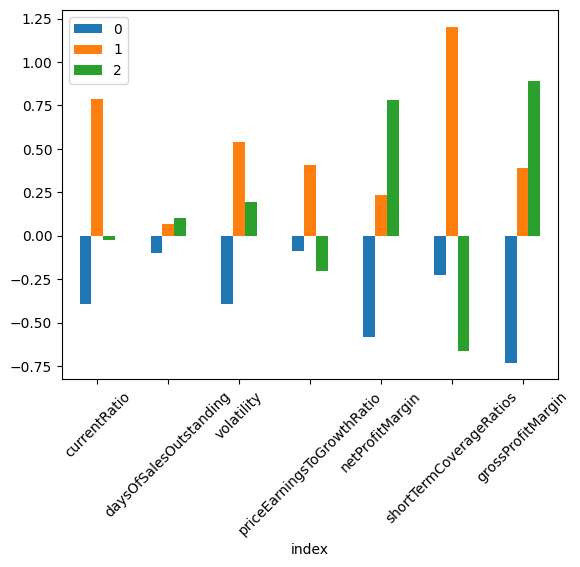

In [ ]:
ax = mean_df_t.plot.bar(x='index', rot=45)

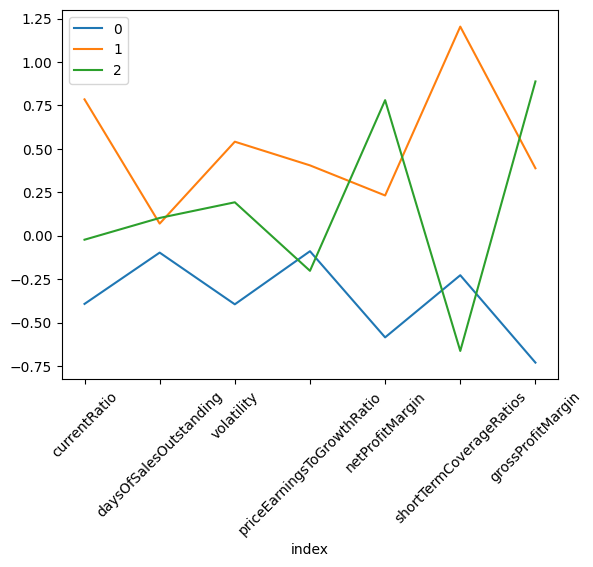

In [ ]:
ax = mean_df_t.plot.line(x='index', rot=45)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_20000\488721774.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_features['cluster'] = df_complete.loc[:,'cluster'].copy()


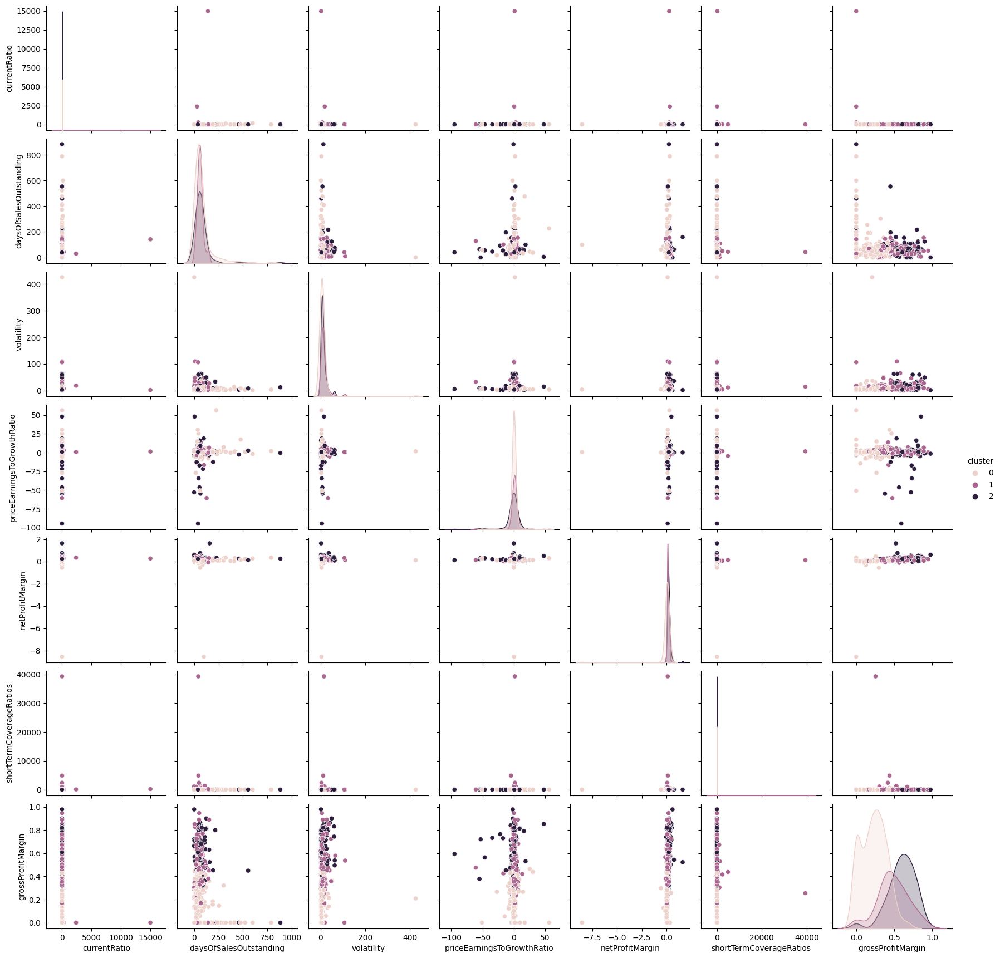

In [ ]:
selected_features['cluster'] = df_complete.loc[:,'cluster'].copy()
# selected_features
sns.pairplot(selected_features, hue="cluster")